# Generación de datos

**Iteración 1: Desarrollo de modelos**
1. Outliers
2. Estandarización
3. Selección de variables, Tree Selection etc, matriz de correlación etc.
3. Definir modelos candidatos (regresión lineal, random forest, red neuronal etc)
4. Selección de hiperparametros (Gridsearch)
5. Entrenamiento de modelos.
6. Evaluación de modelos.
7. Selección de modelos.

**Iteración 2: Feature Engineering**
1. Creación de nuevas variables, clusters k-means, lags, medias moviles.
2. Estandarización.
3. PCA, TSNE etc.
4. Selección de variables.
5. Selección de hiperparametros (Gridsearch)
6. Entrenamiento de modelos.
7. Evaluación de modelos.
6. Selección de modelo final.

Link data: https://www.kaggle.com/wkirgsn/electric-motor-temperature/discussion/196165

In [43]:
# Libreria Core del lab.
import numpy as np
import pandas as pd
import datetime
from datetime import timedelta
from IPython.display import HTML
from plotly.subplots import make_subplots
# Libreria para plotear (En colab esta desactualizado plotly)
#!pip install --upgrade plotly
import pickle
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import metrics
# Librerias utiles
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split 
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import FunctionTransformer
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
import warnings
import missingno as msno
import plotly.offline as py
py.init_notebook_mode()
warnings.filterwarnings("ignore")

# Lectura 

In [44]:
df=pd.read_csv("measures_v2.csv")
df.head()

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id
0,-0.450682,18.805172,19.086670,-0.350055,18.293219,0.002866,0.004419,0.000328,24.554214,18.316547,19.850691,0.187101,17
1,-0.325737,18.818571,19.092390,-0.305803,18.294807,0.000257,0.000606,-0.000785,24.538078,18.314955,19.850672,0.245417,17
2,-0.440864,18.828770,19.089380,-0.372503,18.294094,0.002355,0.001290,0.000386,24.544693,18.326307,19.850657,0.176615,17
3,-0.327026,18.835567,19.083031,-0.316199,18.292542,0.006105,0.000026,0.002046,24.554018,18.330833,19.850647,0.238303,17
4,-0.471150,18.857033,19.082525,-0.332272,18.291428,0.003133,-0.064317,0.037184,24.565397,18.326662,19.850639,0.208197,17


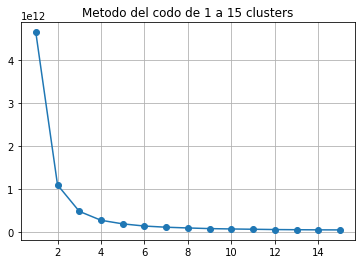

In [45]:
# Respuesta
random_state = 20

sse = []
clusters = list(range(1, 16))
for k in clusters:
    kmeans = KMeans(n_clusters=k, random_state=random_state).fit(df[df.columns[:-1]])
    sse.append(kmeans.inertia_)

plt.plot(clusters, sse, marker="o")
plt.title("Metodo del codo de 1 a 15 clusters")
plt.grid(True)
plt.show()

# Alcance del proyecto: Predecir la temperatura del rotor.

**se elimina la variable torque, ya que esta altamente correlacionada con la temperatura del rotor.**

In [3]:
df=df.drop(["torque"],axis=1)

In [4]:
df.shape

(1330816, 12)

# Valores faltantes y outliers

**Valores faltantes**

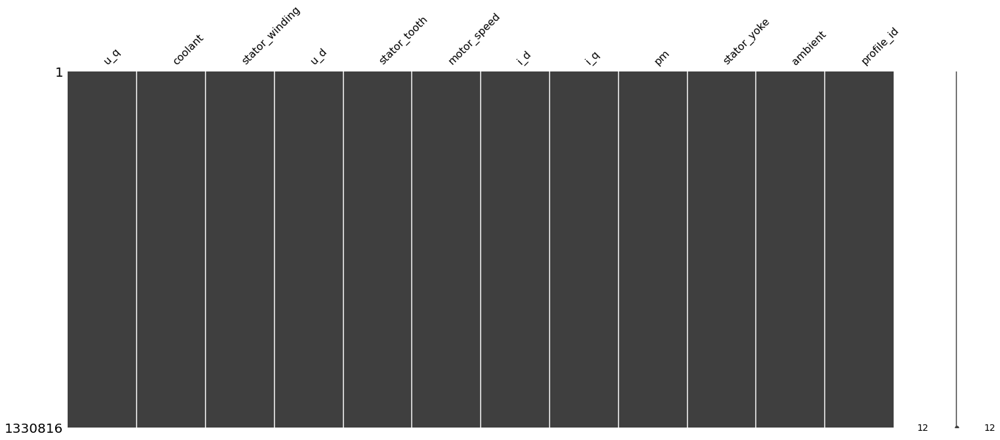

In [5]:
# Matriz de missing
msno.matrix(df)
plt.show()

In [6]:
df.isnull().sum()

u_q               0
coolant           0
stator_winding    0
u_d               0
stator_tooth      0
motor_speed       0
i_d               0
i_q               0
pm                0
stator_yoke       0
ambient           0
profile_id        0
dtype: int64

**Outliers**

In [7]:
for i in df.columns[:-1]:
    fig = px.histogram(df.sample(5000,random_state=1), x=i, marginal="box",  title="Box Plot "+i)
    fig.show()

**Remoción de outliers**

In [8]:
# Función que remueve  outliers
def without_outliers(df):
    df_=df.copy()
    for i in df.columns[:-1]:
         
        # Se obtienen los valores estadísticos para calcular IQR:
        Q3=df_[i].describe()[6]
        Q1=df_[i].describe()[4]
        IQR=Q3-Q1
        
        # Se imponen las condiciones que deben cumplir los valores típicos:
        df_=df_.loc[(df_[i]> Q1-1.5*IQR) & (df_[i]<Q3+1.5*IQR)].reset_index(drop=True)
      
    return df_ 

In [9]:
df=without_outliers(df)

**Distribución despues de remover outliers.**

In [10]:
for i in df.columns[:-1]:
    fig = px.histogram(df.sample(5000,random_state=1), x=i, marginal="box",  title="Box Plot "+i)
    fig.show()

**Se observa que ya no existen datos fuera de las colas.**

# Creación de nuevas variables

In [11]:
def lag_mm_vars(df):
  
    targets = ["pm","profile_id"]
    df_vars = df.copy()

    for column in df_vars:
        if (column not in targets):
            df_vars[f'{column}_(t-1)'] = df_vars[column].shift(1)
            df_vars[f'{column}_(t-2)'] = df_vars[column].shift(2)
            df_vars[f'{column}_(t-3)'] = df_vars[column].shift(3)
            df_vars[f'{column}_mm_4t'] = df_vars[column].rolling(window=4).mean()  
            df_vars[f'{column}_mm_24t'] = df_vars[column].rolling(window=24).mean()
    return df_vars

In [12]:
# Agrupamos cada profile y aplicamos la creación de variables, de modo de respetar la temporalidad de cada uno
frames=[]
for i in df["profile_id"].unique():
    profile=df[df["profile_id"]==i]
    profile_vars=lag_mm_vars(profile)
    frames.append(profile_vars)

# Concatenación de frames
df = pd.concat([i for i in frames], 
                   axis=0)

In [13]:
df=df.interpolate().dropna()

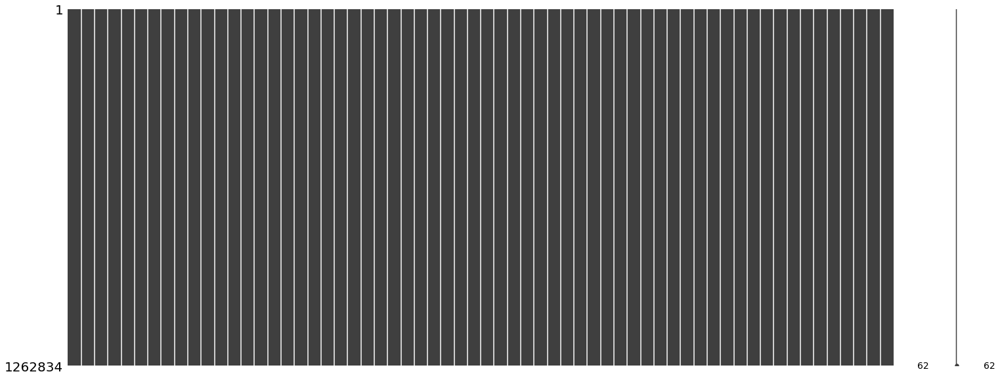

In [14]:
# Matriz de missing
msno.matrix(df)
plt.show()

In [15]:
df

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,...,stator_yoke_(t-1),stator_yoke_(t-2),stator_yoke_(t-3),stator_yoke_mm_4t,stator_yoke_mm_24t,ambient_(t-1),ambient_(t-2),ambient_(t-3),ambient_mm_4t,ambient_mm_24t
23,-0.974433,18.856869,19.099064,0.803171,18.285889,0.000163,-1.997703,1.093383,24.530256,18.301168,...,18.302208,18.306240,18.308954,18.304643,18.315501,19.860540,19.864464,19.869940,19.863168,19.864113
24,-0.421774,18.885250,19.098103,0.665910,18.288511,4.788293,-2.099720,2.062774,24.523567,18.300852,...,18.301168,18.302208,18.306240,18.302617,18.314847,19.857727,19.860540,19.864464,19.859611,19.864322
25,5.692666,18.936125,19.090200,-1.205160,18.292667,117.777489,-3.191215,11.296728,24.525579,18.303978,...,18.300852,18.301168,18.302208,18.302052,18.314390,19.855713,19.857727,19.860540,19.857062,19.864472
26,16.276485,18.967649,19.082493,-6.805256,18.293257,333.672150,-6.213004,26.670506,24.487629,18.321259,...,18.303978,18.300852,18.301168,18.306814,18.314179,19.854269,19.855713,19.857727,19.855236,19.864579
27,30.292931,18.974653,19.082378,-14.666523,18.291941,630.395325,-8.841185,39.179131,24.462027,18.330458,...,18.321259,18.303978,18.300852,18.314137,18.314164,19.853235,19.854269,19.855713,19.853928,19.864656
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1262852,-2.152128,30.721298,45.274497,0.791801,41.934347,0.000380,-2.000169,1.097528,62.147780,38.653720,...,38.666899,38.667498,38.669609,38.664432,38.725350,24.005006,24.005277,23.979933,23.994824,24.024786
1262853,-2.258684,30.721306,45.239017,0.778900,41.868923,0.002985,-2.000499,1.097569,62.142646,38.656328,...,38.653720,38.666899,38.667498,38.661111,38.717764,23.989078,24.005006,24.005277,23.992515,24.020504
1262854,-2.130312,30.721312,45.211576,0.804914,41.804819,0.002301,-1.999268,1.098765,62.138387,38.650923,...,38.656328,38.653720,38.666899,38.656968,38.710056,23.970700,23.989078,24.005006,23.985505,24.014079
1262855,-2.268498,30.721316,45.193508,0.763091,41.762220,0.005662,-2.000999,1.095696,62.133422,38.655686,...,38.650923,38.656328,38.653720,38.654164,38.702841,23.977234,23.970700,23.989078,23.984609,24.009945


# Generación de datos de entrenamiento y test

**Extraremos dos perfil en particular con el objetivo de poder visualizar si el modelo de ML es capaz de seguir una prueba completa de buena manera.**

In [16]:
# 2 perfiles de prueba
profiles=df[df["profile_id"].isin([20,67])]

# Eliminamos estos perfiles de la data
df=df[~df["profile_id"].isin([20,67])]

# ya no es util el tag de profile_id
df.drop(["profile_id"],axis=1,inplace=True)

In [17]:
# Generación conjunto de train y test

features = df.drop(columns=["pm"]).copy() 
labels = df.loc[:,"pm"].copy()

# Generación de conjuntos de train y test
X_train, X_test, y_train, y_test = train_test_split(
    features, labels, test_size=0.33,random_state=50)

# Normalización  de variables

In [19]:
# Columns transformer
preprocessing_transformer = ColumnTransformer(
    transformers=[
        ('MinMaxScaler',MinMaxScaler(),
         features.columns),
    ])

pipe = Pipeline(
    [("preprocesamiento", preprocessing_transformer)]
)

In [20]:
# Entrenamiento de pípeline
X_train=pd.DataFrame(pipe.fit_transform(X_train),columns=features.columns)
X_test=pd.DataFrame(pipe.transform(X_test),columns=features.columns)

# Selección de variables

In [160]:
# Según el aporte de información con el criterio gini de un arbol de decisión
fs = DecisionTreeClassifier(criterion='gini', max_depth=10, random_state=1)
fs.fit(X_train, y_train.astype(int))

DecisionTreeClassifier(max_depth=10, random_state=1)

In [161]:
# Guardar modelo:
pickle.dump(fs, open('fs.pkl', "wb"))

In [21]:
# Leer modelo:
fs = pickle.load(open('fs.pkl', 'rb'))

In [23]:
var_num = 30
table = pd.DataFrame({'Tags': features.columns, 'Value': fs.feature_importances_})
table['Abs_Value'] = table['Value'].abs()
table = table[table['Abs_Value']>0].sort_values(by='Abs_Value', ascending=False, ignore_index=True)
tree_fs = table.loc[:var_num, 'Tags'].to_list()

**Nos quedamos con las 30 mejores, posteriormente se procede a eliminar tags correlacionados entre si.**

In [24]:
# Plot
fig = go.Figure([go.Bar(x=table["Tags"], y=table["Abs_Value"])])

fig.update_layout(
    title_text="Importancia de variables",
)

fig.show()

# Correlación de variables

In [25]:
# Corr
correlations = features.corr()

fig=px.imshow(correlations,
          labels=dict(x="", y="", color="Correlation"),
          x=features.columns,
          y=features.columns,
          zmin=-1,
          zmax=1,
          color_continuous_scale="Inferno")

fig.layout.height = 1000
fig.layout.width = 1000

fig.show()

**Eliminamos las variables correlacionadas si tienen una correlación mayor a 0.7.**

In [26]:
def corrkill(dataframe, features, corr_cut=0.7):

    df = dataframe[features]
    dfcorr = pd.DataFrame(np.triu(df.corr()), columns=df.columns, index=df.columns)
    dfcorr = dfcorr.stack().reset_index()
    dfcorr.columns = ['Feat1','Feat2','Val']
    dfcorr = dfcorr[~dfcorr['Val'].isin([0,1])]
    dfcorr = dfcorr[dfcorr['Val'].abs()>corr_cut]
    
    return list(dfcorr['Feat2']), dfcorr

In [27]:
collinearity, table_cor=corrkill(features, tree_fs)

In [28]:
tag_select = [i for i in tree_fs if i not in collinearity]
tags_view_corr = features[tag_select].copy().reset_index(drop=True)

In [30]:
# Corr
correlations = tags_view_corr.corr()

fig=px.imshow(correlations,
          labels=dict(x="", y="", color="Correlation"),
          x=tag_select,
          y=tag_select,
          zmin=-1,
          zmax=1,
          color_continuous_scale="Inferno")

fig.layout.height = 700
fig.layout.width = 700
fig.update_xaxes(
        tickangle = 45)

fig.show()

# Model

## Random Forest


In [202]:
# Entrenamiento provisorio
pm_regressor=RandomForestRegressor(max_depth=5,max_features=0.6,n_estimators=1000,
                                   random_state=1).fit(X_train[tag_select], y_train)

In [ ]:
# Hacer grilla (?)
#from sklearn.model_selection import HalvingGridSearchCV

#hgs = HalvingGridSearchCV(pipe1, param_grid, verbose=10)

In [203]:
# Guardar modelo:
#pickle.dump(pm_regressor, open('model_pm_regressor.pkl', "wb"))

In [36]:
# Leer modelo:
pm_regressor= pickle.load(open('model_pm_regressor.pkl', 'rb'))

# Evaluación

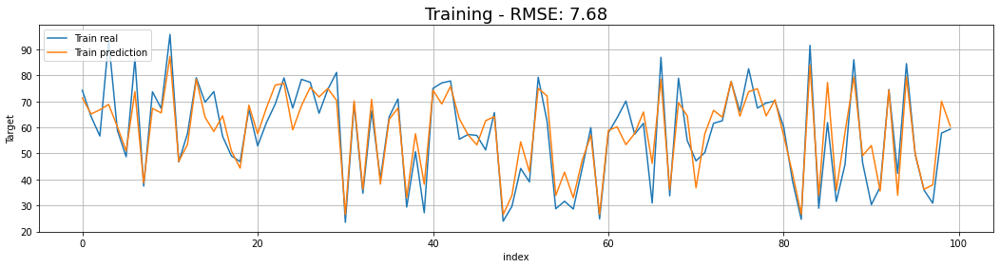

In [37]:
train_mse = metrics.mean_squared_error(y_train, pm_regressor.predict(X_train[tag_select]), squared=False)

_ = plt.figure(figsize=(18, 4))
_ = plt.plot(y_train.values[0:100], label='Train real')
_ = plt.plot(pm_regressor.predict(X_train[tag_select])[0:100], label='Train prediction')
_ = plt.xlabel('index')
_ = plt.ylabel('Target')
_ = plt.grid(True)
_ = plt.legend(loc='upper left')
_ = plt.title('Training - RMSE: {}'.format(train_mse.round(2)), fontsize=18)

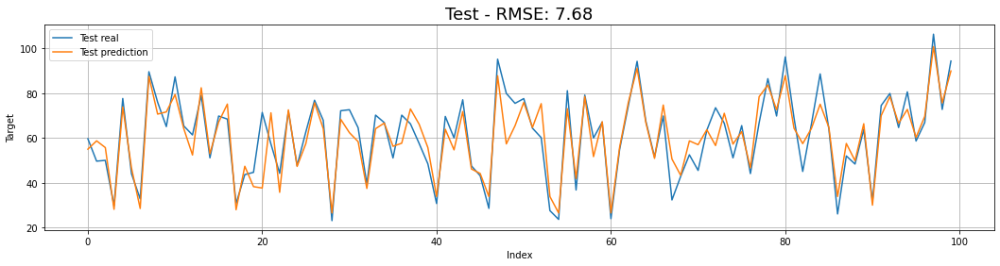

In [38]:
test_mse = metrics.mean_squared_error(y_test, pm_regressor.predict(X_test[tag_select]), squared=False)

_ = plt.figure(figsize=(18, 4))
_ = plt.plot(y_test.values[0:100], label='Test real')
_ = plt.plot( pm_regressor.predict(X_test[tag_select])[0:100], label='Test prediction')
_ = plt.xlabel('Index')
_ = plt.ylabel('Target')
_ = plt.grid(True)
_ = plt.legend(loc='upper left')
_ = plt.title('Test - RMSE: {}'.format(test_mse.round(2)), fontsize=18)

# Visualización de seguimiento de profiles de prueba

In [39]:
data_20=profiles[profiles["profile_id"]==20].drop(["pm","profile_id"],axis=1)
y_20=profiles[profiles["profile_id"]==20]["pm"]
data_67=profiles[profiles["profile_id"]==67].drop(["pm","profile_id"],axis=1)
y_67=profiles[profiles["profile_id"]==67]["pm"]

In [40]:
test1=pd.DataFrame(pipe.transform(data_20),columns=data_20.columns)[tag_select]
test2=pd.DataFrame(pipe.transform(data_67),columns=data_67.columns)[tag_select]

In [41]:
# Predict perfil
predict= pm_regressor.predict(test1)

# Visualización
fig = go.Figure()


fig.add_trace(go.Scatter(y=predict,
                    mode='lines',
                    name="Predict"))

fig.add_trace(go.Scatter(y=y_20,
                    mode='lines',
                    name="Variable real"))

fig.update_layout(
    title="Predict v/s target real pm",
    xaxis_title="Muestras de tiempo",
    yaxis_title="Variable objetivo",
    legend_title="",
    font=dict(
        size=12,
        color="black"
    )
) 
    
fig.show()

In [42]:
# Predict perfil
predict= pm_regressor.predict(test2)

# Visualización
fig = go.Figure()


fig.add_trace(go.Scatter(y=predict,
                    mode='lines',
                    name="Predict"))

fig.add_trace(go.Scatter(y=y_67,
                    mode='lines',
                    name="Variable real"))

fig.update_layout(
    title="Predict v/s target real pm",
    xaxis_title="Muestras de tiempo",
    yaxis_title="Variable objetivo",
    legend_title="",
    font=dict(
        size=12,
        color="black"
    )
) 
    
fig.show()